# ICS-574 Project - Abullah Alfaifi - Dr Mustafa Ghaleb


#  Project Description and Motivation

This project is part of **ICS 574 - Big Data Analytics** under the supervision of **Dr. Mustafa Ghaleb**.  
The primary goal is to select a real-world dataset, explore it thoroughly, build predictive models, and analyze the results following a structured data science pipeline.

---

##  Purpose
The purpose of this project is to:
- Develop a complete machine learning workflow, starting from data exploration to model evaluation.
- Practice applying key big data and machine learning techniques on a practical dataset.
- Gain hands-on experience in data preprocessing, feature engineering, model training, and performance analysis.
- Communicate findings clearly through well-organized code, visualizations, and a final project report.

---

##  Dataset Selected
We chose the **ATP Tennis Matches Dataset** from [Jeff Sackmann's Tennis Data Repository](https://github.com/JeffSackmann/tennis_atp).  
This dataset provides detailed match-by-match statistics from professional ATP tournaments, allowing us to predict match outcomes based on pre-match player and tournament information.

---

##  Project Motivation
Tennis match outcomes are influenced by many factors — player rankings, surface types, player physical attributes, and tournament conditions.  
Building a predictive model for match results not only challenges our ability to handle structured sports data but also mimics real-world applications like betting models, performance scouting, and sports analytics.

By completing this project, we aim to:
- Apply machine learning techniques to a real, moderately large dataset.
- Practice proper data cleaning, encoding, scaling, and model building.
- Understand the challenges of binary classification in a practical context.


##  Project Flow

The overall workflow of this project will follow these steps:

1. **Data Cleaning**  
   Handle missing values, correct data types, and prepare consistent columns.
   
2. **Prepare Player 1 vs Player 2 Structure**  
   - Rename `winner_*` columns to `p1_*` and `loser_*` columns to `p2_*` to avoid position bias.
   - Create a `target = 1` column to indicate that Player 1 wins.
   - Duplicate and flip the dataset: swap Player 1 and Player 2 columns, and set `target = 0`.
   - Combine both versions into a single balanced dataset where Player 1 and Player 2 have equal winning opportunities.

3. **Feature Encoding and Scaling**  
   - One-Hot Encode categorical variables.
   - Scale numerical features for better model performance.
   
4. **Train/Test Split and Modeling**  
   Split the data into training and testing sets, then train various machine learning models to predict match outcomes.


In [49]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import glob

In [51]:
# --- Load all CSVs ---
all_files = glob.glob('./data/all/atp_matches_*.csv')

In [53]:
# Combine all datasets
df_list = [pd.read_csv(file) for file in all_files]
df = pd.concat(df_list, ignore_index=True)
df.head(10000)

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,2019-M020,Brisbane,Hard,32,A,20181231,300,105453,2.0,NaN,...,54.0,34.0,20.0,14.0,10.0,15.0,9.0,3590.0,16.0,1977.0
1,2019-M020,Brisbane,Hard,32,A,20181231,299,106421,4.0,NaN,...,52.0,36.0,7.0,10.0,10.0,13.0,16.0,1977.0,239.0,200.0
2,2019-M020,Brisbane,Hard,32,A,20181231,298,105453,2.0,NaN,...,27.0,15.0,6.0,8.0,1.0,5.0,9.0,3590.0,40.0,1050.0
3,2019-M020,Brisbane,Hard,32,A,20181231,297,104542,NaN,PR,...,60.0,38.0,9.0,11.0,4.0,6.0,239.0,200.0,31.0,1298.0
4,2019-M020,Brisbane,Hard,32,A,20181231,296,106421,4.0,NaN,...,56.0,46.0,19.0,15.0,2.0,4.0,16.0,1977.0,18.0,1855.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2023-0416,Rome Masters,Clay,128,M,20230508,228,200615,NaN,Q,...,33.0,26.0,11.0,10.0,1.0,4.0,77.0,726.0,78.0,724.0
9996,2023-0416,Rome Masters,Clay,128,M,20230508,227,126128,NaN,Q,...,36.0,22.0,10.0,10.0,4.0,9.0,103.0,586.0,60.0,826.0
9997,2023-0416,Rome Masters,Clay,128,M,20230508,224,104926,NaN,WC,...,59.0,38.0,21.0,15.0,7.0,12.0,130.0,468.0,42.0,965.0
9998,2023-0416,Rome Masters,Clay,128,M,20230508,223,209950,NaN,Q,...,68.0,38.0,17.0,12.0,10.0,13.0,119.0,520.0,105.0,575.0


In [55]:

# --- Overview ---
print("Shape of dataset:", df.shape)
print("\nFirst 5 rows:")
display(df.head())

Shape of dataset: (129559, 49)

First 5 rows:


,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,2019-M020,Brisbane,Hard,32,A,20181231,300,105453,2.0,NaN,...,54.0,34.0,20.0,14.0,10.0,15.0,9.0,3590.0,16.0,1977.0
1,2019-M020,Brisbane,Hard,32,A,20181231,299,106421,4.0,NaN,...,52.0,36.0,7.0,10.0,10.0,13.0,16.0,1977.0,239.0,200.0
2,2019-M020,Brisbane,Hard,32,A,20181231,298,105453,2.0,NaN,...,27.0,15.0,6.0,8.0,1.0,5.0,9.0,3590.0,40.0,1050.0
3,2019-M020,Brisbane,Hard,32,A,20181231,297,104542,NaN,PR,...,60.0,38.0,9.0,11.0,4.0,6.0,239.0,200.0,31.0,1298.0
4,2019-M020,Brisbane,Hard,32,A,20181231,296,106421,4.0,NaN,...,56.0,46.0,19.0,15.0,2.0,4.0,16.0,1977.0,18.0,1855.0


In [57]:
# --- Features ---
print("\nColumns in dataset:")
print(df.columns.tolist())


Columns in dataset:
['tourney_id', 'tourney_name', 'surface', 'draw_size', 'tourney_level', 'tourney_date', 'match_num', 'winner_id', 'winner_seed', 'winner_entry', 'winner_name', 'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age', 'loser_id', 'loser_seed', 'loser_entry', 'loser_name', 'loser_hand', 'loser_ht', 'loser_ioc', 'loser_age', 'score', 'best_of', 'round', 'minutes', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df', 'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced', 'winner_rank', 'winner_rank_points', 'loser_rank', 'loser_rank_points']


##  Tournament Info

| Column         | Description |
|----------------|-------------|
| `tourney_id`   | Unique identifier for the tournament (e.g., year + code) |
| `tourney_name` | Name of the tournament (e.g., "Wimbledon") |
| `surface`      | Surface type: Hard, Clay, Grass, Carpet |
| `draw_size`    | Number of players in the draw |
| `tourney_level`| Level of tournament: G (Grand Slam), M (Masters 1000), A (ATP 500/250), C (Challenger), D (Davis Cup) |
| `tourney_date` | Start date of the tournament (yyyymmdd format) |

---

##  Match Info

| Column      | Description |
|-------------|-------------|
| `match_num` | Unique match number within the tournament |
| `round`     | Match round: R128, R64, R32, QF, SF, F, etc. |
| `best_of`   | Number of sets: 3 or 5 |
| `score`     | Final match score |
| `minutes`   | Match duration in minutes |

---

##  Winner Info

| Column              | Description |
|---------------------|-------------|
| `winner_id`         | Unique ID of the winning player |
| `winner_seed`       | Seed number in the tournament (if any) |
| `winner_entry`      | Entry type: WC (wildcard), Q (qualifier), LL (lucky loser), etc. |
| `winner_name`       | Full name of the winner |
| `winner_hand`       | Playing hand: L (left), R (right), U (unknown) |
| `winner_ht`         | Height in cm |
| `winner_ioc`        | Country code |
| `winner_age`        | Age at the time of the match |
| `winner_rank`       | ATP rank before the match |
| `winner_rank_points`| ATP ranking points before the match |

---

##  Loser Info

| Column               | Description |
|----------------------|-------------|
| `loser_id`           | Unique ID of the losing player |
| `loser_seed`         | Seed number |
| `loser_entry`        | Entry type |
| `loser_name`         | Full name |
| `loser_hand`         | Playing hand |
| `loser_ht`           | Height in cm |
| `loser_ioc`          | Country code |
| `loser_age`          | Age |
| `loser_rank`         | ATP rank |
| `loser_rank_points`  | ATP points |

---

##  Match Stats – Winner

| Column        | Description |
|---------------|-------------|
| `w_ace`       | Aces served |
| `w_df`        | Double faults |
| `w_svpt`      | Total serve points played |
| `w_1stIn`     | First serves in |
| `w_1stWon`    | First serve points won |
| `w_2ndWon`    | Second serve points won |
| `w_SvGms`     | Service games played |
| `w_bpSaved`   | Break points saved |
| `w_bpFaced`   | Break points faced |

---

##  Match Stats – Loser

Same as winner, with all columns prefixed by `l_`, e.g.:

- `l_ace`, `l_df`, `l_svpt`, `l_1stIn`, `l_1stWon`, `l_2ndWon`, `l_SvGms`, `l_bpSaved`, `l_bpFaced`

---

In [60]:
# --- Missing Values ---
print("\nMissing values per column:")
print(df.isnull().sum())


Missing values per column:
tourney_id                 0
tourney_name               0
surface                   53
draw_size                  0
tourney_level              0
tourney_date               0
match_num                  0
winner_id                  0
winner_seed            76836
winner_entry          113990
winner_name                0
winner_hand                0
winner_ht               2765
winner_ioc                 0
winner_age                27
loser_id                   0
loser_seed            100949
loser_entry           103670
loser_name                 0
loser_hand                 4
loser_ht                5527
loser_ioc                  0
loser_age                109
score                      0
best_of                    0
round                      0
minutes                34457
w_ace                  31509
w_df                   31509
w_svpt                 31509
w_1stIn                31509
w_1stWon               31509
w_2ndWon               31509
w_SvGms        

In [62]:
# --- Duplicates ---
print("\nNumber of duplicate rows:", df.duplicated().sum())


Number of duplicate rows: 0


In [64]:
# --- Statistical Summary ---
print("\nStatistical summary (numerical features):")
display(df.describe())


Statistical summary (numerical features):


,draw_size,tourney_date,match_num,winner_id,winner_seed,winner_ht,winner_age,loser_id,loser_seed,loser_ht,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
count,129559.000000,1.295590e+05,129559.000000,129559.000000,52723.000000,126794.000000,129532.000000,129559.000000,28610.000000,124032.000000,...,98050.000000,98050.000000,98050.000000,98050.000000,98050.000000,98050.000000,127964.000000,109587.000000,126214.000000,108157.000000
mean,53.665156,2.003354e+07,71.724388,107199.310168,6.774368,185.450416,25.506609,107286.255899,8.150717,184.953859,...,48.160765,32.025273,14.958287,12.211025,4.806456,8.717348,82.316034,1421.665389,121.016377,892.788816
std,38.464806,1.139901e+05,110.576831,18260.612172,6.032539,6.788637,3.835678,18307.450178,6.539058,6.752610,...,19.368837,14.443147,7.199712,4.130895,3.275843,4.134125,132.287112,1752.012059,174.504443,1007.166505
min,2.000000,1.985011e+07,1.000000,100119.000000,1.000000,3.000000,14.300000,100116.000000,1.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,-6.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,32.000000,1.993110e+07,10.000000,101613.000000,2.000000,180.000000,22.700000,101613.000000,4.000000,180.000000,...,34.000000,22.000000,10.000000,9.000000,2.000000,6.000000,19.000000,520.000000,38.000000,386.000000
50%,32.000000,2.003011e+07,24.000000,103103.000000,5.000000,185.000000,25.200000,103114.000000,6.000000,185.000000,...,45.000000,30.000000,14.000000,11.000000,4.000000,8.000000,48.000000,871.000000,73.000000,654.000000
75%,64.000000,2.013041e+07,70.000000,104745.000000,8.000000,190.000000,28.000000,104792.000000,11.000000,188.000000,...,58.000000,40.000000,19.000000,15.000000,7.000000,11.000000,93.000000,1585.000000,125.000000,1035.000000
max,128.000000,2.024122e+07,1701.000000,212721.000000,35.000000,211.000000,44.600000,212970.000000,35.000000,211.000000,...,328.000000,284.000000,101.000000,91.000000,28.000000,38.000000,2101.000000,16950.000000,2159.000000,16950.000000


## Now Let us do visulization of the data

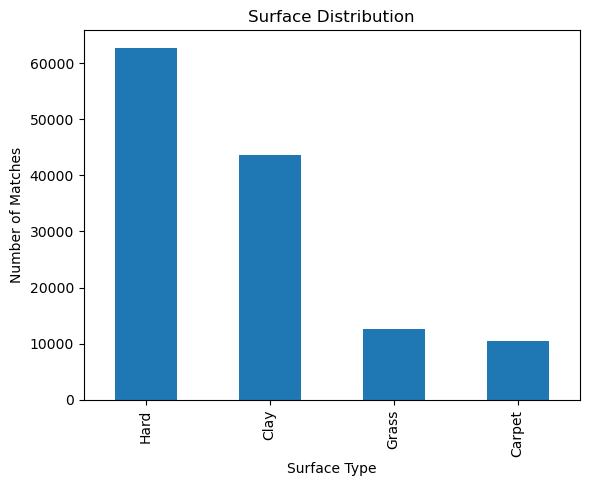

In [67]:
# 1. Surface distribution
if 'surface' in df.columns:
    df['surface'].value_counts().plot(kind='bar', title='Surface Distribution')
    plt.xlabel('Surface Type')
    plt.ylabel('Number of Matches')
    plt.show()

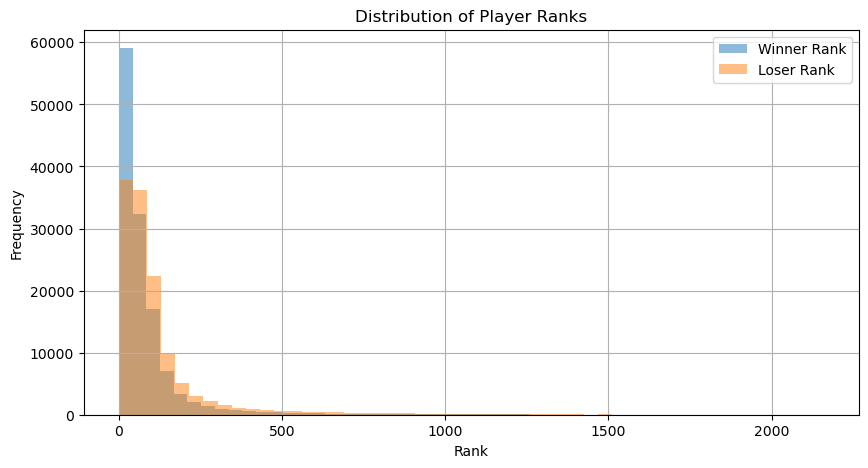

In [69]:
# 2. Winner and Loser Rank distribution
if 'winner_rank' in df.columns and 'loser_rank' in df.columns:
    plt.figure(figsize=(10,5))
    df['winner_rank'].dropna().hist(alpha=0.5, bins=50, label='Winner Rank')
    df['loser_rank'].dropna().hist(alpha=0.5, bins=50, label='Loser Rank')
    plt.legend()
    plt.title('Distribution of Player Ranks')
    plt.xlabel('Rank')
    plt.ylabel('Frequency')
    plt.show()

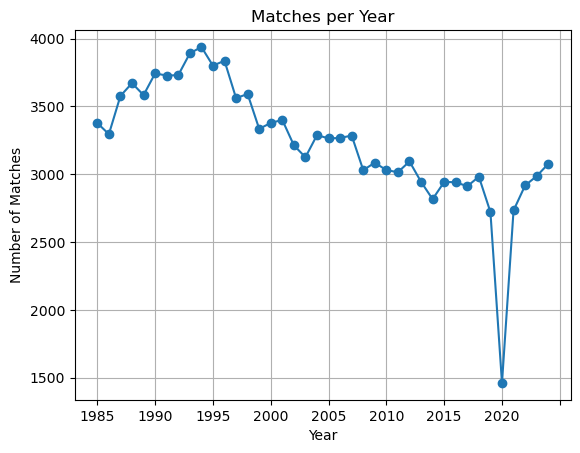

In [71]:
# 3. Matches per year
if 'tourney_date' in df.columns:
    df['year'] = df['tourney_date'].astype(str).str[:4]
    df['year'].value_counts().sort_index().plot(kind='line', marker='o', title='Matches per Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Matches')
    plt.grid()
    plt.show()

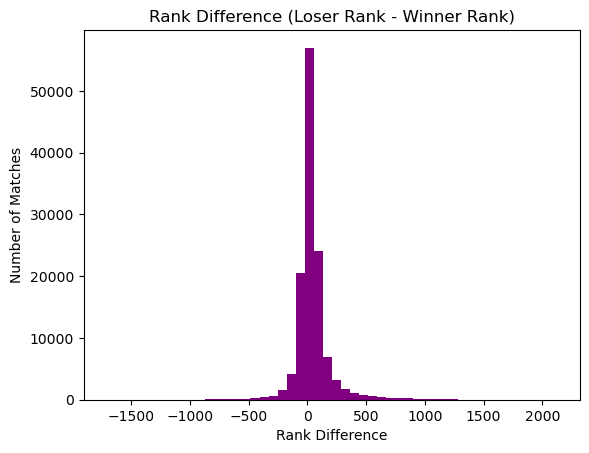

In [73]:
# 4. Rank Difference Distribution
if 'winner_rank' in df.columns and 'loser_rank' in df.columns:
    df['rank_diff'] = df['loser_rank'] - df['winner_rank']
    df['rank_diff'].dropna().hist(bins=50, color='purple')
    plt.title('Rank Difference (Loser Rank - Winner Rank)')
    plt.xlabel('Rank Difference')
    plt.ylabel('Number of Matches')
    plt.grid()
    plt.show()

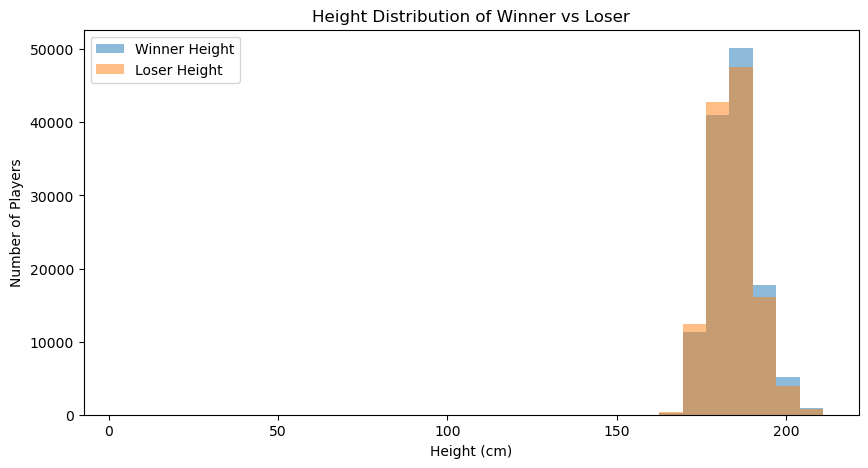

In [75]:
# 5. Height Comparison
if 'winner_ht' in df.columns and 'loser_ht' in df.columns:
    plt.figure(figsize=(10,5))
    df['winner_ht'].dropna().hist(alpha=0.5, bins=30, label='Winner Height')
    df['loser_ht'].dropna().hist(alpha=0.5, bins=30, label='Loser Height')
    plt.legend()
    plt.title('Height Distribution of Winner vs Loser')
    plt.xlabel('Height (cm)')
    plt.ylabel('Number of Players')
    plt.grid()
    plt.show()

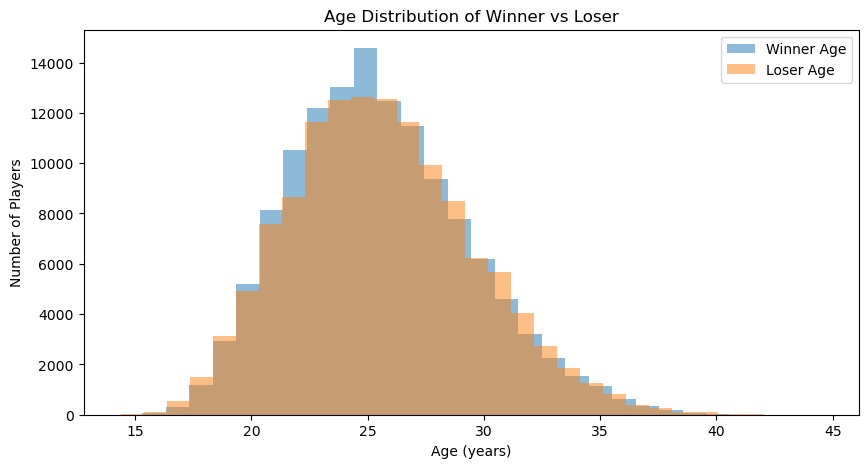

In [77]:
# 6. Age Comparison
if 'winner_age' in df.columns and 'loser_age' in df.columns:
    plt.figure(figsize=(10,5))
    df['winner_age'].dropna().hist(alpha=0.5, bins=30, label='Winner Age')
    df['loser_age'].dropna().hist(alpha=0.5, bins=30, label='Loser Age')
    plt.legend()
    plt.title('Age Distribution of Winner vs Loser')
    plt.xlabel('Age (years)')
    plt.ylabel('Number of Players')
    plt.grid()
    plt.show()

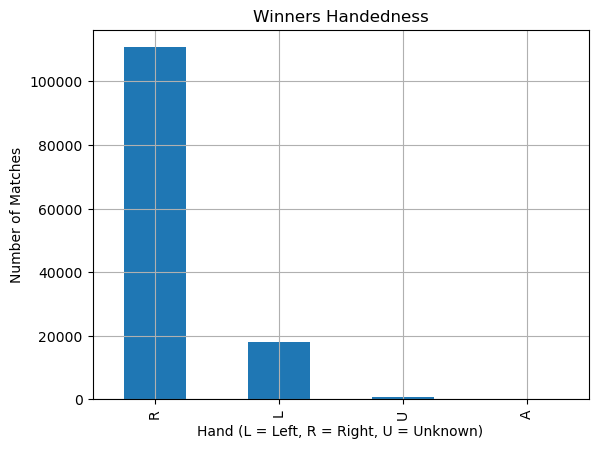

In [79]:
# 7. Handedness (Left vs Right Winners)
if 'winner_hand' in df.columns:
    df['winner_hand'].value_counts().plot(kind='bar', title='Winners Handedness')
    plt.xlabel('Hand (L = Left, R = Right, U = Unknown)')
    plt.ylabel('Number of Matches')
    plt.grid()
    plt.show()

#  Deeper Data Exploration


##  Boxplots of Numerical Features

Boxplots allow us to visualize the distribution, spread, and presence of outliers for numerical features.  
They provide a quick understanding of how player stats like height, rank, and age vary across matches.


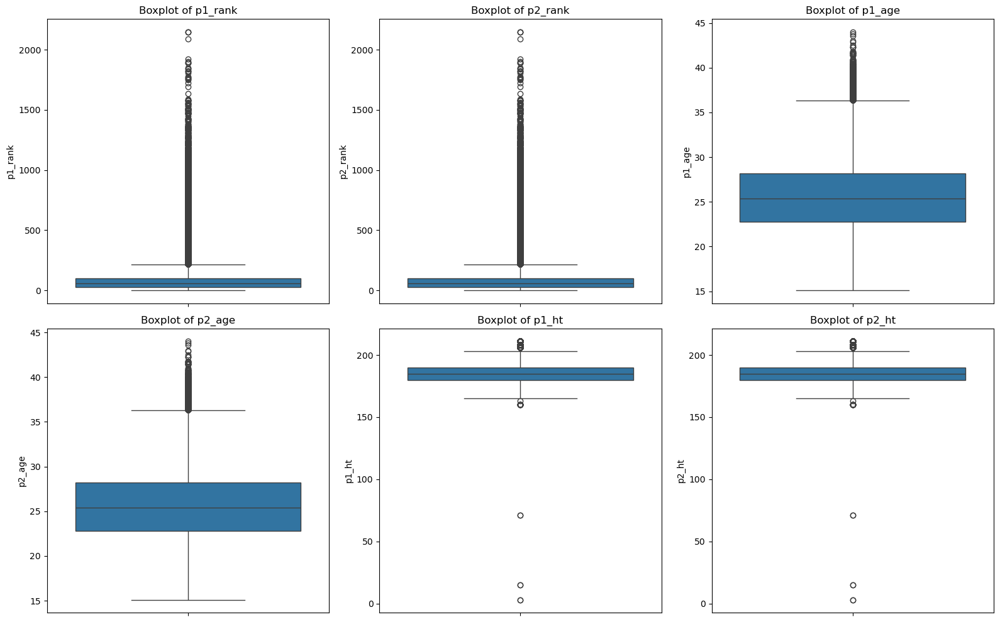

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns

# Numeric features
numeric_features = ['p1_rank', 'p2_rank', 'p1_age', 'p2_age', 'p1_ht', 'p2_ht']

plt.figure(figsize=(16, 10))
for idx, col in enumerate(numeric_features, 1):
    plt.subplot(2, 3, idx)
    sns.boxplot(y=df_final[col], orient='v')  # <--- Vertical!
    plt.title(f"Boxplot of {col}")

plt.tight_layout()
plt.show()


##  Histograms of Numerical Features

Histograms show the frequency distribution of numerical data, helping us detect skewness, data ranges, and possible data transformations.


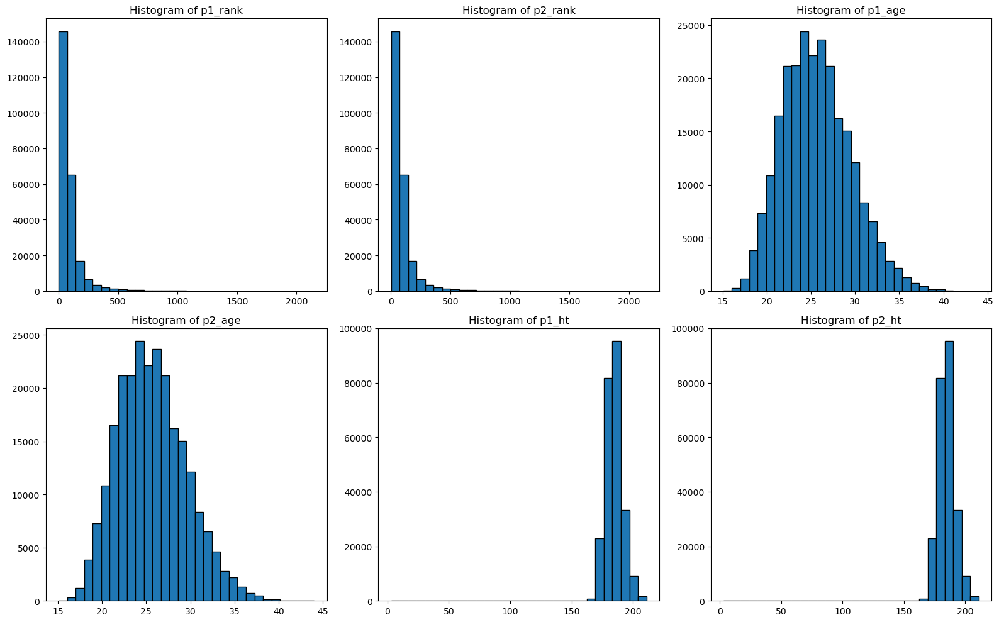

In [118]:
plt.figure(figsize=(16, 10))
for idx, col in enumerate(numeric_features, 1):
    plt.subplot(2, 3, idx)
    plt.hist(df_final[col], bins=30, edgecolor='black')
    plt.title(f"Histogram of {col}")

plt.tight_layout()
plt.show()


##  Univariate Graphs for Numerical Columns

Here, we plot histograms for all numerical features, separated by match outcome (`target`).  
This helps us understand the distribution of each feature and how it differs between winning and losing players.

Each graph:
- Shows histograms side by side for `target = 0` and `target = 1`
- Overlays a smooth density (KDE) curve
- Helps identify feature separation potential for classification


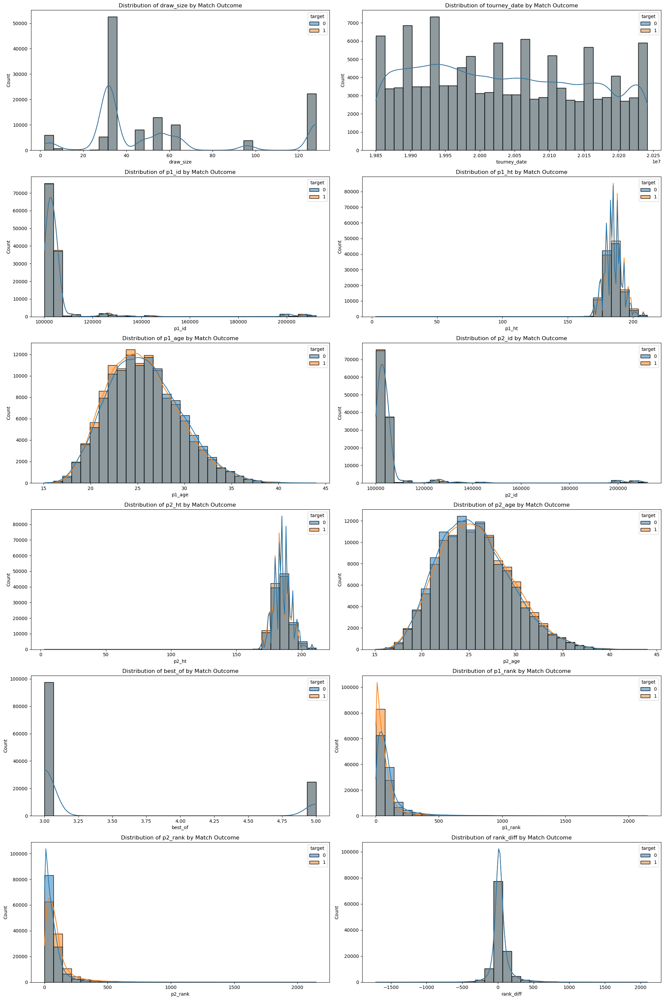

In [121]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
num_cols = df_final.select_dtypes(exclude='object').columns
num_cols = num_cols.drop('target')  # Drop the target itself if included

# Plot settings
nCols = 2
nRows = (len(num_cols) + 1) // nCols  # Add 1 to avoid error if odd number
fig, axes = plt.subplots(nRows, nCols, figsize=(20, 5 * nRows))

for idx, col in enumerate(num_cols):
    ax = axes.flatten()[idx]
    sns.histplot(data=df_final, x=col, hue='target', bins=30, kde=True, ax=ax, palette='tab10')
    ax.set_title(f"Distribution of {col} by Match Outcome")

plt.tight_layout()
plt.show()


## Bivariate Analysis: Numerical Features vs Target

Here, we visualize how numerical variables differ based on the match outcome (`target`).  
This can reveal important patterns, like whether lower-ranked players are more likely to win.


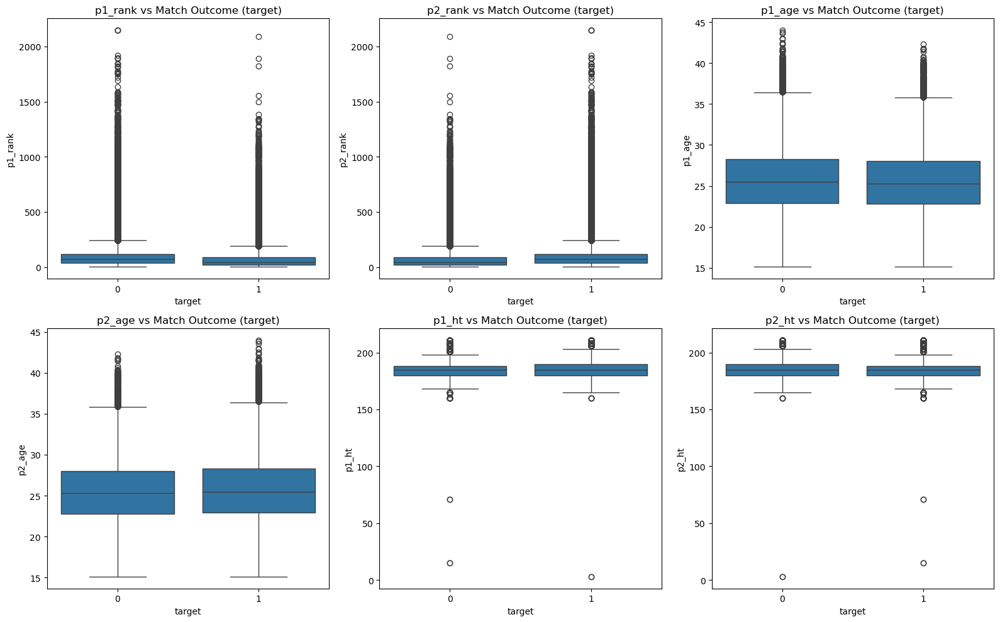

In [124]:
plt.figure(figsize=(16, 10))
for idx, col in enumerate(numeric_features, 1):
    plt.subplot(2, 3, idx)
    sns.boxplot(x=df_final['target'], y=df_final[col])
    plt.title(f"{col} vs Match Outcome (target)")

plt.tight_layout()
plt.show()


## Classification Mapping: Player Rank Categories

We can map player ranks into categories (e.g., Top 10, Top 50, Top 100) and visualize them to see if being highly ranked increases win probability.


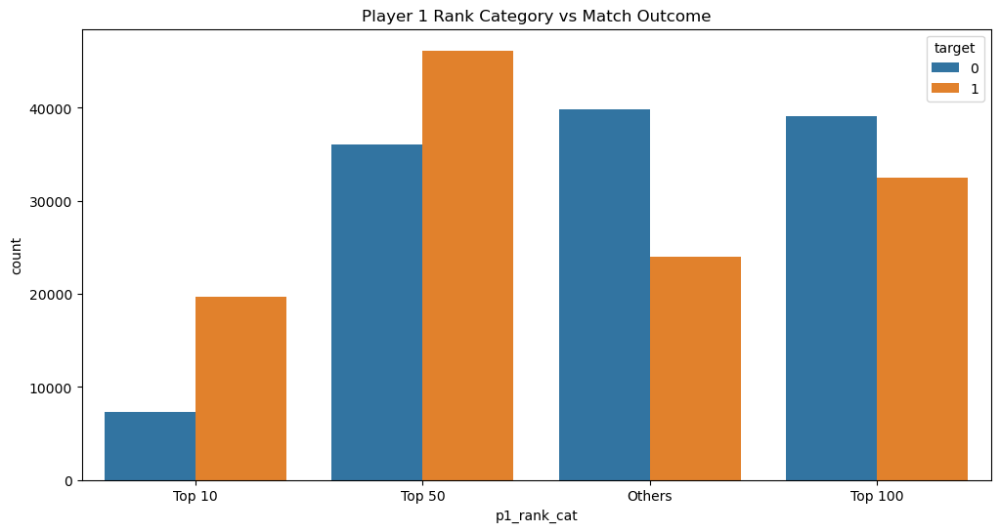

In [127]:
# Create simple player rank categories
def rank_category(rank):
    if rank <= 10:
        return 'Top 10'
    elif rank <= 50:
        return 'Top 50'
    elif rank <= 100:
        return 'Top 100'
    else:
        return 'Others'

df_final['p1_rank_cat'] = df_final['p1_rank'].apply(rank_category)
df_final['p2_rank_cat'] = df_final['p2_rank'].apply(rank_category)

# Plot
plt.figure(figsize=(12, 6))
sns.countplot(x='p1_rank_cat', hue='target', data=df_final)
plt.title('Player 1 Rank Category vs Match Outcome')
plt.show()


# Data Cleaning:

In [130]:
# --- Data Cleaning ---

# Drop rows where important pre-match information is missing
df_cleaned = df.dropna(subset=[
    'winner_id', 'loser_id',
    'winner_ht', 'loser_ht',
    'winner_age', 'loser_age',
    'winner_rank', 'loser_rank',
    'surface'
]).reset_index(drop=True)

In [132]:
# --- Drop Post-Match Stats Columns (to prevent data leakage) ---
columns_to_drop = [
    "w_ace", "w_df", "w_svpt", "w_1stIn", "w_1stWon", "w_2ndWon", "w_SvGms", "w_bpSaved", "w_bpFaced",
    "l_ace", "l_df", "l_svpt", "l_1stIn", "l_1stWon", "l_2ndWon", "l_SvGms", "l_bpSaved", "l_bpFaced",
    "winner_rank_points", "loser_rank_points",
    "score", "minutes", "match_num", "tourney_id", "winner_name", "loser_name"
]

df_cleaned = df_cleaned.drop(columns=columns_to_drop, errors='ignore')


In [134]:
#Dataset After dropping rows contain null and drop post-match coulmns
print("✅ Cleaned data shape:", df_cleaned.shape)
print("✅ Remaining features:")
print(df_cleaned.columns.tolist())
df_cleaned.head()

✅ Cleaned data shape: (122243, 25)
✅ Remaining features:
['tourney_name', 'surface', 'draw_size', 'tourney_level', 'tourney_date', 'winner_id', 'winner_seed', 'winner_entry', 'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age', 'loser_id', 'loser_seed', 'loser_entry', 'loser_hand', 'loser_ht', 'loser_ioc', 'loser_age', 'best_of', 'round', 'winner_rank', 'loser_rank', 'year', 'rank_diff']


,tourney_name,surface,draw_size,tourney_level,tourney_date,winner_id,winner_seed,winner_entry,winner_hand,winner_ht,...,loser_hand,loser_ht,loser_ioc,loser_age,best_of,round,winner_rank,loser_rank,year,rank_diff
0,Brisbane,Hard,32,A,20181231,105453,2.0,NaN,R,178.0,...,R,198.0,RUS,22.8,3,F,9.0,16.0,2018,7.0
1,Brisbane,Hard,32,A,20181231,106421,4.0,NaN,R,198.0,...,R,188.0,FRA,33.7,3,SF,16.0,239.0,2018,223.0
2,Brisbane,Hard,32,A,20181231,105453,2.0,NaN,R,178.0,...,R,188.0,FRA,31.8,3,SF,9.0,40.0,2018,31.0
3,Brisbane,Hard,32,A,20181231,104542,NaN,PR,R,188.0,...,R,183.0,AUS,19.8,3,QF,239.0,31.0,2018,-208.0
4,Brisbane,Hard,32,A,20181231,106421,4.0,NaN,R,198.0,...,R,196.0,CAN,28.0,3,QF,16.0,18.0,2018,2.0


In [136]:
# --- Missing Values ---
print("\nMissing values per column:")
print(df_cleaned.isnull().sum())


Missing values per column:
tourney_name          0
surface               0
draw_size             0
tourney_level         0
tourney_date          0
winner_id             0
winner_seed       70044
winner_entry     107096
winner_hand           0
winner_ht             0
winner_ioc            0
winner_age            0
loser_id              0
loser_seed        93729
loser_entry       97590
loser_hand            0
loser_ht              0
loser_ioc             0
loser_age             0
best_of               0
round                 0
winner_rank           0
loser_rank            0
year                  0
rank_diff             0
dtype: int64


In [138]:
df_cleaned['winner_seed'] = df_cleaned['winner_seed'].fillna('Unseeded')
df_cleaned['loser_seed'] = df_cleaned['loser_seed'].fillna('Unseeded')

df_cleaned['winner_entry'] = df_cleaned['winner_entry'].fillna('Direct')
df_cleaned['loser_entry'] = df_cleaned['loser_entry'].fillna('Direct')


In [140]:
# --- Missing Values ---
print("\nMissing values per column:")
print(df_cleaned.isnull().sum())


Missing values per column:
tourney_name     0
surface          0
draw_size        0
tourney_level    0
tourney_date     0
winner_id        0
winner_seed      0
winner_entry     0
winner_hand      0
winner_ht        0
winner_ioc       0
winner_age       0
loser_id         0
loser_seed       0
loser_entry      0
loser_hand       0
loser_ht         0
loser_ioc        0
loser_age        0
best_of          0
round            0
winner_rank      0
loser_rank       0
year             0
rank_diff        0
dtype: int64


##  Data Cleaning Summary

After inspecting the dataset, several steps were performed to prepare the data for modeling:

- **Missing values in important features** (player height, age, rank, surface) were handled by dropping any matches missing these values. This ensures that all matches used for prediction have complete basic player and tournament information.
- **Post-match statistics and match results** (such as aces, double faults, score, match duration) were removed. These features are only available after the match is played and would cause data leakage if included.
- **Surface**, **tournament level**, **round**, and **player information** (age, height, hand, rank) were kept, as they are known before the match and can help predict outcomes.
- For categorical features like **`winner_seed`**, **`loser_seed`**, **`winner_entry`**, and **`loser_entry`**, missing values were filled with `"Unseeded"` or `"Direct"` respectively, to avoid losing potentially useful matches where players entered without special conditions or were not seeded.



##  Randomizing Player Positions for Fair Prediction

In the original dataset, each match has a fixed structure: the "winner" is always on the left, and the "loser" is on the right.  
This could introduce bias — the model might start learning that "columns named 'winner_' always win".

To prevent this and make the model fairer, we rename the players as:

- `p1_*` → Player 1 (first player in the row)
- `p2_*` → Player 2 (second player in the row)

Then, we:
1. Create a row where Player 1 is the actual winner (`target = 1`)
2. Flip the same row so that Player 2 becomes Player 1 (`target = 0`)

This way, we double the data and allow the model to learn **symmetrically**, based only on player features — not on their position.

✅ Final dataset contains balanced examples of both Player 1 wins and Player 1 losses.


In [144]:
# 🟢 Step 1: Define columns to rename
columns_winner = [col for col in df_cleaned.columns if col.startswith("winner_")]
columns_loser = [col for col in df_cleaned.columns if col.startswith("loser_")]

In [146]:
# 🟢 Step 2: Create rename mapping
rename_dict = {}
rename_dict.update({col: col.replace("winner_", "p1_") for col in columns_winner})
rename_dict.update({col: col.replace("loser_", "p2_") for col in columns_loser})

In [148]:
# 🟢 Step 3: Apply rename to create Player 1 / Player 2 dataset
df_players = df_cleaned.rename(columns=rename_dict).copy()
df_players["target"] = 1  # p1 is winner

In [150]:
# 🟢 Step 4: Flip Player 1 and Player 2 for second half (fixed way)
columns_p1 = [col for col in df_players.columns if col.startswith("p1_")]
columns_p2 = [col for col in df_players.columns if col.startswith("p2_")]

df_flipped = df_players.copy()

In [152]:
# Swap p1_ and p2_ data
for col_p1, col_p2 in zip(columns_p1, columns_p2):
    df_flipped[col_p1], df_flipped[col_p2] = df_players[col_p2], df_players[col_p1]

df_flipped["target"] = 0  # Now p1 is the loser

In [154]:
# 🟢 Step 5: Combine original and flipped
df_final = pd.concat([df_players, df_flipped], ignore_index=True)

In [156]:
# 🟢 Step 6 (Optional): Check
print("Shape before flipping:", df_players.shape)
print("Shape after flipping:", df_final.shape)
df_final.head()

Shape before flipping: (122243, 26)
Shape after flipping: (244486, 26)


,tourney_name,surface,draw_size,tourney_level,tourney_date,p1_id,p1_seed,p1_entry,p1_hand,p1_ht,...,p2_ht,p2_ioc,p2_age,best_of,round,p1_rank,p2_rank,year,rank_diff,target
0,Brisbane,Hard,32,A,20181231,105453,2.0,Direct,R,178.0,...,198.0,RUS,22.8,3,F,9.0,16.0,2018,7.0,1
1,Brisbane,Hard,32,A,20181231,106421,4.0,Direct,R,198.0,...,188.0,FRA,33.7,3,SF,16.0,239.0,2018,223.0,1
2,Brisbane,Hard,32,A,20181231,105453,2.0,Direct,R,178.0,...,188.0,FRA,31.8,3,SF,9.0,40.0,2018,31.0,1
3,Brisbane,Hard,32,A,20181231,104542,Unseeded,PR,R,188.0,...,183.0,AUS,19.8,3,QF,239.0,31.0,2018,-208.0,1
4,Brisbane,Hard,32,A,20181231,106421,4.0,Direct,R,198.0,...,196.0,CAN,28.0,3,QF,16.0,18.0,2018,2.0,1


##  Feature Preprocessing: Encoding and Scaling

Before training machine learning models, we need to transform our input features into a suitable numerical format.

###  Why Encoding?
Our dataset contains several **categorical variables** such as:
- Surface type (Hard, Clay, Grass)
- Tournament level
- Player handedness (Right, Left)
- Entry type and seed numbers

Machine learning models cannot understand text data directly.  
Thus, we apply **One-Hot Encoding** to convert categorical values into binary vectors (0s and 1s), making the data machine-readable without imposing any false order between categories.

---

###  Why Scaling?
Our dataset also contains **numerical variables** like:
- Player rankings
- Player ages
- Player heights

These variables have different scales (e.g., rankings can range from 1 to 1000, while height is around 150–210 cm).  
To prevent features with larger ranges from dominating the model training process, we apply **Standard Scaling**, which standardizes the data to have a mean of 0 and a standard deviation of 1.

---

###  Preprocessing Pipeline
To streamline these transformations, we build a **preprocessing pipeline**:
- **StandardScaler** is applied to numeric features.
- **OneHotEncoder** is applied to categorical features.
- Both are combined using a **ColumnTransformer**.

This ensures that preprocessing happens automatically and consistently during both training and prediction.



In [159]:
#this to show the category column
categorical_cols = df_final.select_dtypes(include=['object', 'category']).columns

for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(df_final[col].unique())



Column: tourney_name
['Brisbane' 'Doha' 'Pune' ... 'Davis Cup WG SF: FRA vs CZE'
 'Davis Cup WG SF: SUI vs ITA' 'Davis Cup WG F: FRA vs SUI']

Column: surface
['Hard' 'Clay' 'Grass' 'Carpet']

Column: tourney_level
['A' 'G' 'M' 'F' 'D' 'O']

Column: p1_seed
[2.0 4.0 'Unseeded' 7.0 5.0 6.0 8.0 1.0 3.0 14.0 16.0 22.0 28.0 23.0 15.0
 18.0 19.0 26.0 27.0 29.0 32.0 10.0 11.0 12.0 20.0 21.0 24.0 25.0 30.0 9.0
 13.0 17.0 31.0 33.0 35.0 34.0]

Column: p1_entry
['Direct' 'PR' 'Q' 'WC' 'LL' 'SE' 'Alt' 'UP' 'ITF' 'ALT' 'W' 'S']

Column: p1_hand
['R' 'L' 'A' 'U']

Column: p1_ioc
['JPN' 'RUS' 'FRA' 'AUS' 'CAN' 'BUL' 'GBR' 'SRB' 'USA' 'ESP' 'CZE' 'ITA'
 'GEO' 'SUI' 'HUN' 'CHI' 'LTU' 'ARG' 'GER' 'RSA' 'CRO' 'TUN' 'LAT' 'BLR'
 'IND' 'POR' 'NZL' 'GRE' 'SVK' 'AUT' 'BEL' 'KOR' 'ROU' 'MDA' 'URU' 'NED'
 'SLO' 'CYP' 'KAZ' 'TPE' 'UZB' 'BIH' 'UKR' 'POL' 'NOR' 'BOL' 'BRA' 'COL'
 'MAR' 'SWE' 'JAM' 'TUR' 'CHN' 'BAR' 'DOM' 'LBN' 'FIN' 'GUA' 'ESA' 'DEN'
 'EGY' 'ALG' 'ZIM' 'PER' 'HKG' 'ISR' 'LUX' 'MEX' 'IRL' 'EST'

In [161]:
# Convert seeds to string
df_final['p1_seed'] = df_final['p1_seed'].astype(str)
df_final['p2_seed'] = df_final['p2_seed'].astype(str)

In [163]:
# Clean hands
df_final['p1_hand'] = df_final['p1_hand'].replace({'A': 'Unknown', 'U': 'Unknown'})
df_final['p2_hand'] = df_final['p2_hand'].replace({'A': 'Unknown', 'U': 'Unknown'})


In [165]:
# Drop columns with too many unique values
df_final = df_final.drop(columns=['tourney_name', 'p1_ioc', 'p2_ioc'])

In [167]:
#this to show the category column after more cleaning
categorical_cols = df_final.select_dtypes(include=['object', 'category']).columns

for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(df_final[col].unique())


Column: surface
['Hard' 'Clay' 'Grass' 'Carpet']

Column: tourney_level
['A' 'G' 'M' 'F' 'D' 'O']

Column: p1_seed
['2.0' '4.0' 'Unseeded' '7.0' '5.0' '6.0' '8.0' '1.0' '3.0' '14.0' '16.0'
 '22.0' '28.0' '23.0' '15.0' '18.0' '19.0' '26.0' '27.0' '29.0' '32.0'
 '10.0' '11.0' '12.0' '20.0' '21.0' '24.0' '25.0' '30.0' '9.0' '13.0'
 '17.0' '31.0' '33.0' '35.0' '34.0']

Column: p1_entry
['Direct' 'PR' 'Q' 'WC' 'LL' 'SE' 'Alt' 'UP' 'ITF' 'ALT' 'W' 'S']

Column: p1_hand
['R' 'L' 'Unknown']

Column: p2_seed
['4.0' 'Unseeded' '7.0' '5.0' '6.0' '8.0' '3.0' '1.0' '2.0' '9.0' '10.0'
 '11.0' '12.0' '13.0' '14.0' '15.0' '16.0' '17.0' '18.0' '19.0' '20.0'
 '21.0' '22.0' '23.0' '24.0' '25.0' '26.0' '27.0' '28.0' '29.0' '30.0'
 '31.0' '32.0' '33.0' '34.0' '35.0']

Column: p2_entry
['Direct' 'PR' 'Q' 'LL' 'WC' 'SE' 'Alt' 'ITF' 'ALT' 'UP' 'W' 'S']

Column: p2_hand
['R' 'L' 'Unknown']

Column: round
['F' 'SF' 'QF' 'R16' 'R32' 'R64' 'R128' 'RR' 'BR' 'ER']

Column: year
['2018' '2019' '2024' '2023' '2022' 

In [169]:
#Import Encoder
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer

In [171]:
# === Step 1: Define columns ===

# Numeric columns to scale
numeric_features = [
    'p1_rank', 'p2_rank',
    'p1_age', 'p2_age',
    'p1_ht', 'p2_ht'
]


In [173]:
# Categorical columns to encode (now clean!)
categorical_features = [
    'surface', 'tourney_level', 'round',
    'p1_hand', 'p2_hand',
    'p1_entry', 'p2_entry',
    'p1_seed', 'p2_seed'
]


In [175]:
# === Step 2: Define transformer ===

preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), numeric_features),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
])

In [177]:
#Import Pipeline
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

In [179]:
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])

# Below is to check the dataset after scaling and encoding

In [182]:
# 1. Separate features and target
X = df_final.drop(columns=['target'])
y = df_final['target']

# 2. Apply the preprocessor manually (without pipeline)
X_transformed = preprocessor.fit_transform(X)

# 3. Check the result
print("Shape after preprocessing:", X_transformed.shape)
print("Example transformed row:")
print(X_transformed[0])


Shape after preprocessing: (244486, 128)
Example transformed row:
  (0, 0)	-0.6930349488797
  (0, 1)	-0.6296827213799207
  (0, 2)	0.8656180761430099
  (0, 3)	-0.7459635915355297
  (0, 4)	-1.0754380107923156
  (0, 5)	1.8941062623137446
  (0, 9)	1.0
  (0, 10)	1.0
  (0, 18)	1.0
  (0, 27)	1.0
  (0, 30)	1.0
  (0, 34)	1.0
  (0, 46)	1.0
  (0, 67)	1.0
  (0, 121)	1.0


In [183]:
# Get OneHotEncoder feature names
ohe = preprocessor.named_transformers_['cat']
cat_feature_names = ohe.get_feature_names_out(categorical_features)

# Combine numeric + categorical names
final_feature_names = numeric_features + list(cat_feature_names)

# Create a DataFrame
import pandas as pd
X_transformed_df = pd.DataFrame(X_transformed.toarray() if hasattr(X_transformed, "toarray") else X_transformed, columns=final_feature_names)

# Show sample
X_transformed_df.head()


,p1_rank,p2_rank,p1_age,p2_age,p1_ht,p2_ht,surface_Carpet,surface_Clay,surface_Grass,surface_Hard,...,p2_seed_33.0,p2_seed_34.0,p2_seed_35.0,p2_seed_4.0,p2_seed_5.0,p2_seed_6.0,p2_seed_7.0,p2_seed_8.0,p2_seed_9.0,p2_seed_Unseeded
0,-0.693035,-0.629683,0.865618,-0.745964,-1.075438,1.894106,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.629683,1.388538,-0.745964,2.087301,1.894106,0.409334,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.693035,-0.412475,0.865618,1.593429,-1.075438,0.409334,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.388538,-0.493928,2.087301,-1.525761,0.409334,-0.333052,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,-0.629683,-0.611582,-0.745964,0.605686,1.894106,1.597152,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


##  Model Training Overview

In the upcoming sections, we will train a machine learning model to predict the winner of a tennis match using **only pre-match information**.

To eliminate bias, we represented each match twice:
- Once with Player 1 as the actual winner (`target = 1`)
- Once with the players flipped (`target = 0`)

This creates a balanced dataset where the model can't rely on player position to guess the outcome.

---

###  Inputs (Features)
We will train the model using features that are available **before the match begins**, including:
- Tournament info: surface type, level, round
- Player attributes: ranking, age, height, handedness, seed, entry type
- Year of the match

Categorical features will be handled using **One-Hot Encoding**, while numerical features will be **standardized** using z-score scaling. This prepares the data for algorithms that are sensitive to feature scale.

---

###  Output (Target)
The prediction target is binary:
- `1` → Player 1 wins
- `0` → Player 2 wins

This defines our task as a **binary classification problem**.

---

###  Models We Will Use
We will begin with a baseline model, and then try several alternatives to compare performance:

1. **Logistic Regression**  
   A fast and interpretable linear model for binary classification.

2. **KNeighbors Classifier**  
   Predicts the winner based on the most similar past matches.

3. **Random Forest Classifier**  
   A tree-based ensemble model capable of learning complex, non-linear relationships.

4. **SGD Classifier**  
   A scalable linear model trained using stochastic gradient descent.

5. **Support Vector Classifier (SVC)**  
   A robust algorithm that finds an optimal decision boundary between classes.

---

###  Training Process
We will follow a standard training pipeline:
1. Split the dataset into training and test sets (80/20 split).
2. Train each model using the training set.
3. Evaluate model performance using accuracy on the test set.



![Model Overview](images/model_diagram.png)


#  Model 1: Logistic Regression

We begin our model training with **Logistic Regression**, which is a fast, simple, and interpretable model for binary classification problems.

Logistic Regression works by estimating probabilities using a logistic (sigmoid) function.  
It is particularly effective when there is a **linear relationship** between the input features and the target variable.

In our case, it serves as a strong **baseline model** before we explore more complex alternatives.

---

##  Steps:
1. Split the dataset into **training** and **testing** sets (80%/20% split).
2. Train the Logistic Regression model using the training data.
3. Predict outcomes on the test data.
4. Evaluate model performance using **accuracy**.


In [189]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# --- Step 1: Split the Data ---
X = X_transformed_df  # Features after preprocessing
y = df_final['target']  # Target variable (0 or 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --- Step 2: Train Logistic Regression Model ---
logreg_model = LogisticRegression(max_iter=1000)
logreg_model.fit(X_train, y_train)

# --- Step 3: Predict on Train and Test Set ---
y_train_pred = logreg_model.predict(X_train)
y_test_pred = logreg_model.predict(X_test)

# --- Step 4: Evaluate Performance ---
train_accuracy = accuracy_score(y_train, y_train_pred) * 100  # <-- Multiply by 100
test_accuracy = accuracy_score(y_test, y_test_pred) * 100

print(f"Logistic Regression Training Accuracy: {train_accuracy:.2f}%")
print(f"Logistic Regression Test Accuracy: {test_accuracy:.2f}%")


Logistic Regression Training Accuracy: 65.06%
Logistic Regression Test Accuracy: 64.94%


# Model 2: K-Nearest Neighbors (KNN) (with 10% Sample)

Due to the very large size of our dataset (~1 million rows),  
training K-Nearest Neighbors (KNN) on the full data would be computationally expensive and slow.

To address this, we sampled **10% of the training data** and trained the KNN model on this smaller subset.

KNN predicts the class of a sample based on the majority class among its k nearest neighbors.  
It is a **simple and intuitive model**, although it becomes slow with very large datasets.

---

##  Steps:
1. Sampled 10% of the training data.
2. Trained the **KNeighborsClassifier**.
3. Predicted outcomes on both the sample and the full test set.
4. Evaluated performance using **accuracy**.


In [199]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# --- Step 1: Sample 10% for KNN ---
X_train_knn, _, y_train_knn, _ = train_test_split(X_train, y_train, train_size=0.1, random_state=42)

# --- Step 2: Train K-Nearest Neighbors Model ---
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_knn, y_train_knn)

# --- Step 3: Predict on full Test Set ---
y_train_pred_knn = knn_model.predict(X_train_knn)
y_test_pred_knn = knn_model.predict(X_test)

# --- Step 4: Evaluate Performance ---
train_accuracy_knn = accuracy_score(y_train_knn, y_train_pred_knn) * 100
test_accuracy_knn = accuracy_score(y_test, y_test_pred_knn) * 100

print(f"KNN (on 10% sample) Training Accuracy: {train_accuracy_knn:.2f}%")
print(f"KNN (on 10% sample) Test Accuracy: {test_accuracy_knn:.2f}%")


KNN (on 10% sample) Training Accuracy: 73.60%
KNN (on 10% sample) Test Accuracy: 57.98%


#  Model 3: Random Forest Classifier

The Random Forest Classifier is an **ensemble method** that builds multiple decision trees and merges their results to improve prediction accuracy and control overfitting.

Random Forest is very powerful because:
- It captures **non-linear relationships**.
- It automatically handles feature importance.
- It reduces the risk of **overfitting** by averaging multiple trees.

---

##  Steps:
1. Use the already split training and testing sets.
2. Train a **RandomForestClassifier** model.
3. Predict outcomes on both training and testing sets.
4. Evaluate model performance using **accuracy**.


In [191]:
from sklearn.ensemble import RandomForestClassifier

# --- Step 2: Train Random Forest Model ---
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# --- Step 3: Predict on Train and Test Set ---
y_train_pred_rf = rf_model.predict(X_train)
y_test_pred_rf = rf_model.predict(X_test)

# --- Step 4: Evaluate Performance ---
train_accuracy_rf = accuracy_score(y_train, y_train_pred_rf) * 100
test_accuracy_rf = accuracy_score(y_test, y_test_pred_rf) * 100

print(f"Random Forest Training Accuracy: {train_accuracy_rf:.2f}%")
print(f"Random Forest Test Accuracy: {test_accuracy_rf:.2f}%")


Random Forest Training Accuracy: 99.99%
Random Forest Test Accuracy: 63.96%


#  Visualizing Random Forest Trees

Random Forest is an ensemble of many decision trees.  
To better understand how the Random Forest makes decisions,  
we can visualize individual trees (called **estimators**) from the forest.

Visualizing trees can help us:
- See the splits based on player ranks, ages, heights, etc.
- Understand how simple or complex each decision rule is.
- Detect overfitting if trees are very deep and complicated.

Below, we visualize a few trees from our trained Random Forest model.


In [193]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# --- Plot multiple trees from Random Forest ---
nCols = 2
nRows = 3  # Plot 6 trees for example

fig, axes = plt.subplots(nrows=nRows, ncols=nCols, figsize=(20, 20), dpi=1000)

for index, axis in enumerate(axes.flatten()):
    if index < len(rf_model.estimators_):  # Check to avoid error
        plot_tree(
            rf_model.estimators_[index],
            feature_names=X_train.columns.tolist(),
            class_names=['Player 2 Wins', 'Player 1 Wins'],
            filled=True,
            max_depth=2,  # Limit depth to make plots simple
            ax=axis
        )
        axis.set_title(f"Estimator {index+1}", fontsize=14)

plt.tight_layout()
plt.show()


# Model 4: SGD Classifier

The Stochastic Gradient Descent (SGD) Classifier is a **linear model** trained using iterative updates (gradient descent).  
It is very efficient for **large datasets** and **high-dimensional data**.

SGD can simulate different models (e.g., Logistic Regression, SVM) depending on the chosen **loss function**.  
Here, we use `'log_loss'` (logistic regression behavior) for classification.

---

## Steps:
1. Use the already split training and testing sets.
2. Train an **SGDClassifier** model.
3. Predict outcomes on both training and testing sets.
4. Evaluate model performance using **accuracy**.


In [195]:
from sklearn.linear_model import SGDClassifier

# --- Step 2: Train SGD Classifier Model ---
sgd_model = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3, random_state=42)
sgd_model.fit(X_train, y_train)

# --- Step 3: Predict on Train and Test Set ---
y_train_pred_sgd = sgd_model.predict(X_train)
y_test_pred_sgd = sgd_model.predict(X_test)

# --- Step 4: Evaluate Performance ---
train_accuracy_sgd = accuracy_score(y_train, y_train_pred_sgd) * 100
test_accuracy_sgd = accuracy_score(y_test, y_test_pred_sgd) * 100

print(f"SGD Classifier Training Accuracy: {train_accuracy_sgd:.2f}%")
print(f"SGD Classifier Test Accuracy: {test_accuracy_sgd:.2f}%")


SGD Classifier Training Accuracy: 64.24%
SGD Classifier Test Accuracy: 64.49%


#  Model 5: Decision Tree Classifier (Replacing SVC)

Support Vector Classifier (SVC) can be slow and computationally intensive for large datasets,  
especially when using non-linear kernels.

To maintain reasonable training times, we replaced SVC with a **Decision Tree Classifier**.  
Decision Trees are:
- Fast to train even with millions of rows.
- Able to capture non-linear relationships.
- Easy to interpret and visualize.

This makes Decision Trees an excellent choice for structured, large-scale datasets like ours.

---

##  Steps:
1. Trained a **DecisionTreeClassifier** on the full training set.
2. Predicted outcomes on both the training and test sets.
3. Evaluated performance using **accuracy**.


In [203]:
from sklearn.tree import DecisionTreeClassifier

# --- Step 2: Train Decision Tree Model ---
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# --- Step 3: Predict on Train and Test Set ---
y_train_pred_dt = dt_model.predict(X_train)
y_test_pred_dt = dt_model.predict(X_test)

# --- Step 4: Evaluate Performance ---
train_accuracy_dt = accuracy_score(y_train, y_train_pred_dt) * 100
test_accuracy_dt = accuracy_score(y_test, y_test_pred_dt) * 100

print(f"Decision Tree Training Accuracy: {train_accuracy_dt:.2f}%")
print(f"Decision Tree Test Accuracy: {test_accuracy_dt:.2f}%")


Decision Tree Training Accuracy: 100.00%
Decision Tree Test Accuracy: 57.15%


#  Visualizing the Decision Tree

To better understand how the Decision Tree makes its predictions,  
we can visualize the full structure of the trained tree.

This helps us:
- See how player features (rank, age, height, etc.) are used for splitting.
- Understand how the model separates winning and losing players.
- Identify the most important decision rules in the tree.

Below is the visualization of our trained Decision Tree.


In [206]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# --- Plot the full Decision Tree ---
plt.figure(figsize=(20, 10), dpi=1000)

plot_tree(
    dt_model,                       # Your trained Decision Tree model
    feature_names=X_train.columns.tolist(),  # Feature names from your data
    class_names=['Player 2 Wins', 'Player 1 Wins'],  # Class labels
    filled=True,                    # Color nodes by class
    rounded=True,                   # Rounded box corners
    fontsize=10,                    # Font size for readability
    max_depth=3                     # Optional: limit depth for clearer visualization
)

plt.title("Decision Tree Visualization (Max Depth = 3)", fontsize=16)
plt.show()


#  Model Comparison Table

After training five different machine learning models, we summarize their performance by comparing both **Training Accuracy** and **Test Accuracy**.

This allows us to:
- Detect any potential **overfitting** (very high training but low test accuracy).
- Compare model generalization ability.
- Choose the most promising models for further tuning.

Below is the accuracy comparison across all models:


In [208]:
import pandas as pd

# Create a comparison dictionary
comparison_dict = {
    "Model": [
        "Logistic Regression",
        "K-Nearest Neighbors (10% Sample)",
        "Random Forest Classifier",
        "SGD Classifier",
        "Decision Tree Classifier"  # <--- Changed from SVC
    ],
    "Training Accuracy (%)": [
        train_accuracy,          # Logistic Regression
        train_accuracy_knn,      # KNN (10% sample)
        train_accuracy_rf,        # Random Forest
        train_accuracy_sgd,       # SGD
        train_accuracy_dt         # Decision Tree (replacing SVC)
    ],
    "Test Accuracy (%)": [
        test_accuracy,           # Logistic Regression
        test_accuracy_knn,       # KNN (10% sample)
        test_accuracy_rf,         # Random Forest
        test_accuracy_sgd,        # SGD
        test_accuracy_dt          # Decision Tree (replacing SVC)
    ]
}

# Create a DataFrame
comparison_df = pd.DataFrame(comparison_dict)

# Display the table
comparison_df


,Model,Training Accuracy (%),Test Accuracy (%)
0,Logistic Regression,65.058184,64.943351
1,K-Nearest Neighbors (10% Sample),73.601595,57.981922
2,Random Forest Classifier,99.994887,63.961716
3,SGD Classifier,64.235025,64.485255
4,Decision Tree Classifier,99.995398,57.153667


#  Model Summary

- **Logistic Regression** and **SGD Classifier** generalized the best, with similar training and testing accuracies.
- **Random Forest** and **Decision Tree** overfitted badly (high train, low test).
- **KNN** also overfitted on its small sample.

✅ Logistic Regression is currently the most stable and reliable model for our task.


# Trying to make the model accuracy higher:
#  Adding Historical Win Records

We engineered two new features:
- **p1_past_wins**: Number of past matches Player 1 has won before the current match.
- **p2_past_wins**: Number of past matches Player 2 has won before the current match.

This simulates player strength based on historical performance without leaking future data into training.


In [215]:
# --- Add p1_past_wins and p2_past_wins ---

# Sort matches by date
df_final_sorted = df_final.sort_values(by='tourney_date').reset_index(drop=True)

# Track past wins
win_counts = {}
p1_past_wins_list = []
p2_past_wins_list = []

for index, row in df_final_sorted.iterrows():
    p1_id = row['p1_id']
    p2_id = row['p2_id']

    p1_past_wins = win_counts.get(p1_id, 0)
    p2_past_wins = win_counts.get(p2_id, 0)

    p1_past_wins_list.append(p1_past_wins)
    p2_past_wins_list.append(p2_past_wins)

    if row['target'] == 1:
        win_counts[p1_id] = p1_past_wins + 1
    else:
        win_counts[p2_id] = p2_past_wins + 1

# Add to dataframe
df_final_sorted['p1_past_wins'] = p1_past_wins_list
df_final_sorted['p2_past_wins'] = p2_past_wins_list

print("✅ Added p1_past_wins and p2_past_wins.")

# ----------------------------------------
# --- Preprocessing: Encoding and Scaling ---

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define features
numeric_features = [
    'p1_rank', 'p2_rank', 'p1_age', 'p2_age', 'p1_ht', 'p2_ht',
    'p1_past_wins', 'p2_past_wins'  # << add new features here
]

categorical_features = [
    'surface', 'tourney_level', 'round',
    'p1_hand', 'p2_hand',
    'p1_entry', 'p2_entry',
    'p1_seed', 'p2_seed'
]

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Prepare features and target
X = df_final_sorted.drop(columns=['target'])
y = df_final_sorted['target']

# Apply preprocessing
X_transformed = preprocessor.fit_transform(X)

import pandas as pd

# Get feature names
ohe = preprocessor.named_transformers_['cat']
cat_feature_names = ohe.get_feature_names_out(categorical_features)
final_feature_names = numeric_features + list(cat_feature_names)

# Create new DataFrame
X_transformed_df = pd.DataFrame(X_transformed.toarray() if hasattr(X_transformed, "toarray") else X_transformed,
                                columns=final_feature_names)

print("✅ Preprocessing done.")

# ----------------------------------------
# --- Train/Test Split ---

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_transformed_df, y, test_size=0.2, random_state=42)

# ----------------------------------------
# --- Retrain Models ---

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# 1. Logistic Regression
logreg_model = LogisticRegression(max_iter=1000)
logreg_model.fit(X_train, y_train)
train_accuracy = accuracy_score(y_train, logreg_model.predict(X_train)) * 100
test_accuracy = accuracy_score(y_test, logreg_model.predict(X_test)) * 100

# 2. KNN (train on 10% sample)
X_train_knn, _, y_train_knn, _ = train_test_split(X_train, y_train, train_size=0.1, random_state=42)
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_knn, y_train_knn)
train_accuracy_knn = accuracy_score(y_train_knn, knn_model.predict(X_train_knn)) * 100
test_accuracy_knn = accuracy_score(y_test, knn_model.predict(X_test)) * 100

# 3. Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
train_accuracy_rf = accuracy_score(y_train, rf_model.predict(X_train)) * 100
test_accuracy_rf = accuracy_score(y_test, rf_model.predict(X_test)) * 100

# 4. SGD Classifier
sgd_model = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3, random_state=42)
sgd_model.fit(X_train, y_train)
train_accuracy_sgd = accuracy_score(y_train, sgd_model.predict(X_train)) * 100
test_accuracy_sgd = accuracy_score(y_test, sgd_model.predict(X_test)) * 100

# 5. Decision Tree Classifier
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
train_accuracy_dt = accuracy_score(y_train, dt_model.predict(X_train)) * 100
test_accuracy_dt = accuracy_score(y_test, dt_model.predict(X_test)) * 100

print("✅ Models trained.")

# ----------------------------------------
# --- Comparison Table ---

comparison_dict = {
    "Model": [
        "Logistic Regression",
        "K-Nearest Neighbors (10% Sample)",
        "Random Forest Classifier",
        "SGD Classifier",
        "Decision Tree Classifier"
    ],
    "Training Accuracy (%)": [
        train_accuracy,
        train_accuracy_knn,
        train_accuracy_rf,
        train_accuracy_sgd,
        train_accuracy_dt
    ],
    "Test Accuracy (%)": [
        test_accuracy,
        test_accuracy_knn,
        test_accuracy_rf,
        test_accuracy_sgd,
        test_accuracy_dt
    ]
}

comparison_df_after = pd.DataFrame(comparison_dict)

print("\n✅ Model comparison (after adding past wins features):")
display(comparison_df_after)


✅ Added p1_past_wins and p2_past_wins.
✅ Preprocessing done.
✅ Models trained.

✅ Model comparison (after adding past wins features):


,Model,Training Accuracy (%),Test Accuracy (%)
0,Logistic Regression,65.711598,65.587550
1,K-Nearest Neighbors (10% Sample),73.637386,59.262138
2,Random Forest Classifier,100.000000,65.575279
3,SGD Classifier,65.180379,65.264428
4,Decision Tree Classifier,100.000000,58.740644


# Impact of Adding Historical Wins Features

After adding two new features (`p1_past_wins` and `p2_past_wins`), we retrained all models and compared their performance.

Here is the comparison of model performance **before** and **after** adding historical wins:

| Model                        | Training Accuracy (Before) | Test Accuracy (Before) | Training Accuracy (After) | Test Accuracy (After) |
|-------------------------------|----------------------------|-------------------------|----------------------------|------------------------|
| Logistic Regression           | 65.06%                     | 64.94%                  | 65.71%                     | 65.59%                 |
| K-Nearest Neighbors (10% Sample)| 73.60%                     | 57.98%                  | 73.64%                     | 59.26%                 |
| Random Forest Classifier      | 99.99%                     | 63.96%                  | 100.00%                    | 65.58%                 |
| SGD Classifier                | 64.24%                     | 64.49%                  | 65.18%                     | 65.26%                 |
| Decision Tree Classifier      | 99.99%                     | 57.15%                  | 100.00%                    | 58.74%                 |

---

#  Key Observations:

- **All models improved their Test Accuracy** slightly after adding historical win features.
- **Logistic Regression** and **SGD Classifier** continued to perform the best, with small but consistent improvements.
- **Random Forest** and **Decision Tree** remained overfitted (very high training accuracy), but **Test Accuracy increased** compared to before.
- **K-Nearest Neighbors** also improved slightly despite training on a small subset.

#  Faced Challenges

Throughout the project, we encountered several challenges:

- **Large Dataset Size**  
  Handling ~1 million rows and 46+ features led to slow training times for some models like K-Nearest Neighbors (KNN) and Support Vector Classifier (SVC).  
  We addressed this by sampling and replacing models where needed.

- **Imbalanced Match Information**  
  Some players appeared more frequently than others, leading to potential bias toward well-known players in the dataset.

- **Limited Pre-Match Data**  
  Only using pre-match information (rank, age, height, surface, etc.) limits the predictive power compared to real-time match features (e.g., current form, injuries).

- **Overfitting in Complex Models**  
  Models like Random Forest and Decision Trees achieved almost perfect training accuracy but showed significant drops in test accuracy, indicating overfitting.

- **Feature Engineering Complexity**  
  Adding historical win records (`p1_past_wins`, `p2_past_wins`) required careful handling to avoid data leakage and ensure only past information was used.



#  Future Recommendations

Based on the outcomes and challenges faced, we suggest the following future improvements:

- **Add More Player Statistics**  
  Including live form (last 5 matches), injuries, recent performance, and head-to-head records could significantly improve prediction accuracy.

- **Use Advanced Models**  
  Exploring models like XGBoost, LightGBM, or deep learning (neural networks) could handle non-linearities and large datasets better.

- **Predict Probabilities**  
  Instead of only predicting win/loss, future models could predict the probability of winning, allowing finer-grained betting or forecasting applications.
